# Cloud mask and cloud cover detection using Amazon SageMaker

Cloud cover detection and cloud masking is one of the key preprocessing step required in geospatial data analytics when you are working with optical imagery. Machine learning can reduce the required amount of processing power, improve efficiency and performance over time for data preprocessing in geospatial data pipelines. In this workshop, we will be building a ML model using Amazon SageMaker to detect cloud cover in trucolor satellite images and perform cloud masking for further processing. 

We will use supervised learning approach and leverage existing cloud mask data to training a classification model on SageMaker. The AWS services we will use in this workhop are:
* Amazon S3 - To store training data, model artifacts and imagery.
* Amazon ECR - To store container image that will be used for model training.
* Amazon SageMaker - SageMaker notebooks for development and SageMaker training and deploy capabilites for model training and inference deployment

The workshop will use a container image for training the ML model on SageMaker. The container image is built using KNN classifier and additional code is added to simplify the inference for this workshop.  

## Environment setup

Import the necessary libraries and set up variables.

In [7]:
#Import the sagemaker library.

import sagemaker
from sagemaker.s3 import S3Downloader, S3Uploader
import boto3

# To visualize and manipulate images for creating training dataset
from PIL import Image
import pandas as pd
import numpy as np

# Docker image name in ECR for model training.
imageName='cloud-detection'
region='eu-west-1'

# S3 bucket to use for sagemaker model. S3 bucket names are globally unique.  
#bucket = 'awsworkshop-telaviv-spacetech-<yourName_LastName>'
bucket='awsworkshop-telaviv-spacetech-ajitsingh'

# Output location to store model artifacts
outputLocation=f"s3://{bucket}/output"

# IAM Role sagemaker will be using.
role = sagemaker.get_execution_role()
session = sagemaker.Session()

Create a S3 bucket. This bucket will host all the data including, training data, model artifacts and test images.

In [66]:
s3_client = boto3.client('s3', region_name=region)
location = {'LocationConstraint': region}
s3_client.create_bucket(Bucket=bucket, CreateBucketConfiguration=location)

{'ResponseMetadata': {'RequestId': '04H4X18NY7FAVY28',
  'HostId': 'OgPjELNyFqu2gSdskxACuvoChQ1mwghx3p5U0Prm3uRwzEaEV0L4TX9w3gLR6C7aDbCW7A7APYg=',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'x-amz-id-2': 'OgPjELNyFqu2gSdskxACuvoChQ1mwghx3p5U0Prm3uRwzEaEV0L4TX9w3gLR6C7aDbCW7A7APYg=',
   'x-amz-request-id': '04H4X18NY7FAVY28',
   'date': 'Fri, 06 May 2022 14:36:09 GMT',
   'location': 'http://awsworkshop-telaviv-spacetech-ajitsingh.s3.amazonaws.com/',
   'server': 'AmazonS3',
   'content-length': '0'},
  'RetryAttempts': 0},
 'Location': 'http://awsworkshop-telaviv-spacetech-ajitsingh.s3.amazonaws.com/'}

We have made the container image required for the training available through public ECR repository. However, you cannot pull the image from public repository directly into SageMaker - https://github.com/aws/sagemaker-python-sdk/discussions/2350. You will need to create private ECR repository and push the image from the public repo to your private repo.

In [ ]:
private_ecr_repo = 'cloud-detection'
ecr_client = boto3.client('ecr')
ecr_client.create_repository(repositoryName=private_ecr_repo)

To push the image to the private repository, use the terminal window and use the following commands. You can open a terminal window from the Jupyter notebook main window using "new" drop down radio button. 

```
aws ecr-public get-login-password --region us-east-1 | docker login --username AWS --password-stdin public.ecr.aws/r5i1p1n6

docker pull public.ecr.aws/r5i1p1n6/earthobservation:latest

aws ecr get-login-password --region eu-west-1 | docker login --username AWS --password-stdin <your_account_id>.dkr.ecr.eu-west-1.amazonaws.com

docker tag public.ecr.aws/r5i1p1n6/earthobservation:latest <your_account_id>.dkr.ecr.eu-west-1.amazonaws.com/cloud-detection:latest

docker push <your_account_id>.dkr.ecr.eu-west-1.amazonaws.com/cloud-detection:latest
```

In [ ]:
# Configure the image variable that will be used for training.
imageName='cloud-detection'
account = session.boto_session.client("sts").get_caller_identity()["Account"]
region = session.boto_session.region_name
image = f"{account}.dkr.ecr.{region}.amazonaws.com/{imageName}:latest"

## Data Exploration

We will be using a low res satellite image which is made available to you in the zip file. The image is a resized version of a tile downloaded by the AQUA satellite of the middle east region. 
The "*training-dataset*" folder has the resized image has the original image with cloud cover as well as the masked image. We will use the PIL, pandas and numpy libraries to extract RGB pixel information for the original and masked image and create a training dataset to train the ML model. The image is 600x600 which will provide 360000 data points. 

In [9]:
original_image_path='training-dataset/600-MYDcrefl_TrueColor.20009093139-1.tif'
original_image=Image.open(original_image_path)
masked_image_path='training-dataset/masked-600-MYDcrefl_TrueColor.20009093139-1.tif'
masked_image=Image.open(masked_image_path)

Let's look at the original image.

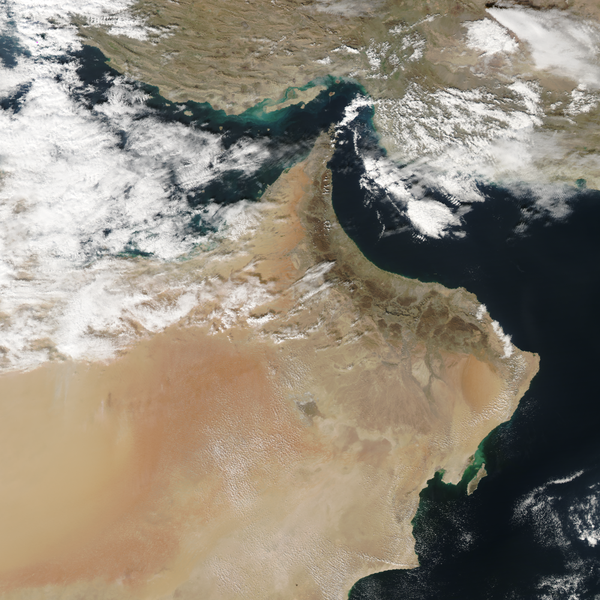

In [10]:
display(original_image)

Let's look at the masked image.

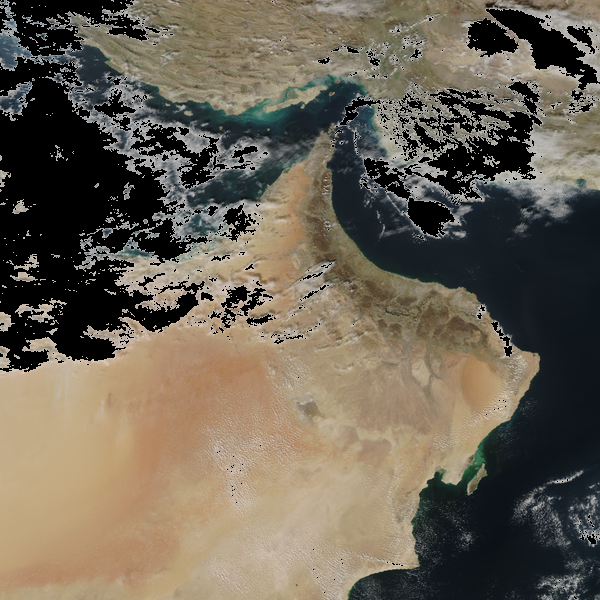

In [11]:
display(masked_image)

Now let's load the image into a numpy array. The image size is 600x600, hence the array should be shaped as 600x600. Furthermore every element of array consists of a array of shape 3x1 which stores the RGB(Red, Blue, Green) pixel values. The array shape for the image originally will be 600x600x3. However, we will use the flattened array of shape 360000x3 for model training.

In [12]:
original_image_array = np.asarray(original_image.getdata(),dtype=np.uint8)
masked_image_array=np.asarray(masked_image.getdata(), dtype=np.uint8)

#Validate if the array is read as flattened array.
print("Original image array shape:",original_image_array.shape)
print("Masked image array shape:",masked_image_array.shape)

Original image array shape: (360000, 3)
Masked image array shape: (360000, 3)


Now let's convert the numpy array into a panda dataframe to do appropriate transformations for the model training.

In [13]:
original_df = pd.DataFrame(original_image_array, columns = ['Red','Blue','Green'])
masked_df = pd.DataFrame(masked_image_array, columns = ['Red','Blue','Green'])

Let's print and check the original and masked dataframes

In [14]:
print('------Original DF--------')
print(original_df)
print('\n------Masked DF--------')
print(masked_df)

------Original DF--------
        Red  Blue  Green
0       195   195    197
1       165   170    173
2       209   213    212
3       208   211    213
4       151   158    164
...     ...   ...    ...
359995  122   129    127
359996  113   116    115
359997   79    86     88
359998   63    69     74
359999   74    81     84

[360000 rows x 3 columns]

------Masked DF--------
        Red  Blue  Green
0         0     0      0
1       165   170    173
2         0     0      0
3         0     0      0
4       151   158    164
...     ...   ...    ...
359995  122   129    127
359996  113   116    115
359997   79    86     88
359998   63    69     74
359999   74    81     84

[360000 rows x 3 columns]


Let us now compare the masked image with the original image and create a label column to mark if a particular pixel is cloud or not. 

In [63]:
compare_df=masked_df.compare(original_df, keep_shape=True, keep_equal=True)
compare_df['cloud_mask'] = 'False'

In [64]:
compare_df.loc[compare_df['Red']['self'] == 0, 'cloud_mask'] = "True"
print(compare_df)

        Red       Blue       Green       cloud_mask
       self other self other  self other           
0         0   195    0   195     0   197       True
1       165   165  170   170   173   173      False
2         0   209    0   213     0   212       True
3         0   208    0   211     0   213       True
4       151   151  158   158   164   164      False
...     ...   ...  ...   ...   ...   ...        ...
359995  122   122  129   129   127   127      False
359996  113   113  116   116   115   115      False
359997   79    79   86    86    88    88      False
359998   63    63   69    69    74    74      False
359999   74    74   81    81    84    84      False

[360000 rows x 7 columns]


We will now drop the columns of the masked image so the ML model will learn the classification only using original RGB values. 

In [58]:
label_df = compare_df.drop(columns=('Red', 'self'))
label_df = label_df.drop(columns=('Blue', 'self'))
label_df = label_df.drop(columns=('Green', 'self'))

         Red  Blue Green cloud_mask
       other other other           
0        195   195   197       True
1        165   170   173      False
2        209   213   212       True
3        208   211   213       True
4        151   158   164      False
...      ...   ...   ...        ...
359995   122   129   127      False
359996   113   116   115      False
359997    79    86    88      False
359998    63    69    74      False
359999    74    81    84      False

[360000 rows x 4 columns]


In [65]:
label_df.to_csv('train.csv', index=False)

We will save the labeled data file as csv to the S3 bucket in the "*train*" folder.

In [69]:
s3uri = 's3://'+bucket+'/train'
S3Uploader.upload('train.csv',s3uri)

's3://awsworkshop-telaviv-spacetech-ajitsingh/train/train.csv'

## ML training and model deployment.

 Establish a session with SageMaker endpoint

In [ ]:
session = sagemaker.Session()
account = session.boto_session.client("sts").get_caller_identity()["Account"]
region = session.boto_session.region_name

Invoke the SageMaker training API to create a model training task.

In [ ]:
# https://sagemaker.readthedocs.io/en/stable/api/training/estimators.html
model = sagemaker.estimator.Estimator(
    image_uri=image,
    role=role,
    instance_count=1,
    input_mode='File',
    instance_type="ml.m5.large",
    sagemaker_session=session,
    output_path=outputLocation
)

model.fit()

Deploy the model to an endpoint

In [ ]:
# Deploy the model
predictor = model.deploy(1, 'ml.m5.large', endpoint_name='cloud-detection4')

## Test model's  inference

### Mask Function

Let's test the mask function of the model by invoking the endpoint. The deployed endpoint is configured to support mask and detect APIs. First let us visualize the original image. For the workshop, you can use the images provided in the "*test*" folder in the material provided for the workshop.

In [72]:
#Visualize the test image.
test_image_1_path = 'test/MYDcrefl_TrueColor-20009093139-1.tif'
test_image_1_file='MYDcrefl_TrueColor-20009093139-1.tif'
test_image_1 = Image.open(test_image_1_path)
#display(test_image_1)

In [74]:
#Copy the test image to S3 bucket
s3Bucket = bucket
s3Key = '/test'
s3uri = "s3://"+s3Bucket+s3Key
S3Uploader().upload(test_image_1_path, s3uri)

's3://awsworkshop-telaviv-spacetech-ajitsingh/test/MYDcrefl_TrueColor-20009093139-1.tif'

Return from endpoint: s3://awsworkshop-telaviv-spacetech-ajitsingh/test/masked-MYDcrefl_TrueColor-20009093139-1.tif
Masked image


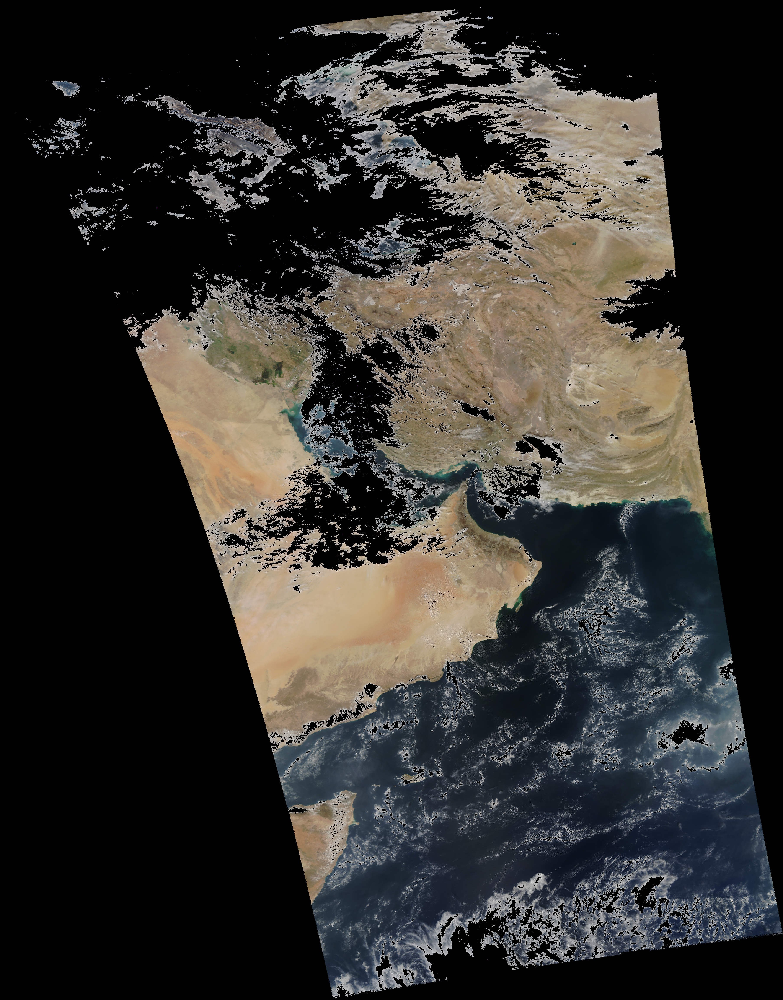

In [75]:
# Set the sagemaker endpoint params
endpoint_name = imageName #imageName
s3Bucket = bucket
content_type = "image/tiff" # "text/plain" \ "image/tiff" , the endpoint is configured to reshape the array returned
                            # by the model and return a constructed image.
function = 'mask' 
inputType = 's3'
s3Key='test/MYDcrefl_TrueColor-20009093139-1.tif'
custom_attributes = f'function={function};inputType={inputType};s3Bucket={s3Bucket};s3Key={s3Key}'
#custom_attributes = 'function=mask;inputType=s3;s3Bucket=aws-gs-test-eu-north-1;s3Key=data/AQUA/modis/level2/MYDcrefl_TrueColor.20059124626.tif'
payload = 'null'

# Call the endpoint
client = boto3.client('sagemaker-runtime')
response = client.invoke_endpoint(
    EndpointName=endpoint_name, 
    CustomAttributes=custom_attributes, 
    ContentType=content_type,
    Body=payload
    )

# Output the text response
b = response['Body']
s3Path = b.read().decode("utf-8")
print("Return from endpoint: {}".format(s3Path))

# Download the masked image from S3
S3Downloader.download(s3Path, '.')
#masked_file = 'masked-{}'.format(test_image_1_path)
masked_file='masked-MYDcrefl_TrueColor-20009093139-1.tif'
image = Image.open(masked_file)

# Display the masked image
print("Masked image")
display(image)

### Detect function

In [ ]:
# Set the sagemaker endpoint params
function = 'detect'
custom_attributes = f'function={function};inputType={inputType};s3Bucket={s3Bucket};s3Key={s3Key}'
#custom_attributes = 'function=mask;inputType=s3;s3Bucket=aws-gs-test-eu-north-1;s3Key=data/AQUA/modis/level2/MYDcrefl_TrueColor.20059124626.tif'
payload = 'null'

# Call the endpoint
client = boto3.client('sagemaker-runtime')
response = client.invoke_endpoint(
    EndpointName=endpoint_name, 
    CustomAttributes=custom_attributes, 
    ContentType=content_type,
    Body=payload
    )

# Output the text response
b = response['Body']
s3Path = b.read().decode("utf-8")
print("Estimated Cloud Percentage: {}%".format(s3Path))